In [22]:
import ast
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

import src.clustering as clu
import src.utils as utils

In [23]:
def load_data(filepath, n=None):
    assert filepath[-4:] == ".csv", "Must be a .csv file"
    data = pd.read_csv(filepath)
    if n:
        data = data.head(n)

    attrs = {
        "titles": data["title"].tolist(),
        "tags": data["tags"].apply(ast.literal_eval).tolist(),
        "ids": data.index.tolist()
    }

    if "simplified_tags" in data.columns:
        attrs["simplified_tags"] = data["simplified_tags"].apply(ast.literal_eval).tolist()

    if "text" in data.columns:
        attrs["text"] = data["text"].tolist()
    else:
        attrs["text"] = data["abstract"].tolist()

    return attrs

def load_embeddings(dataset_name, model_names, n=2000):
    embeddings = []
    for name in model_names:
        embeddings.append(utils.load_from_pickle(f"embeddings/{dataset_name}_{name}_mean_n10000.pickle")[:n])
    return embeddings

# Rando

In [1]:
tag_mapping = {
    'Health': 'Health',
    'Science': 'Science',
    'Books': 'Books',
    'Writing': 'Writing',
    'Marketing': 'Marketing',
    'Productivity': 'Productivity',
    'Storytelling': 'Storytelling',
    'Self Improvement': 'Self Improvement',
    'Machine Learning': 'Technology',
    'Artificial Intelligence': 'Technology',
    'Personal Development': 'Self Improvement',
    'Startup': 'Business',
    'Fiction': 'Books',
    'Creativity': 'Art',
    'Design': 'Art',
    'Data Visualization': 'Technology',
    'Business': 'Business',
    'Environment': 'Lifestyle',
    'Art': 'Art',
    'Humor': 'Entertainment',
    'Social Media': 'Technology',
    'AI': 'Technology',
    'Technology': 'Technology',
    'Leadership': 'Business',
    'Food': 'Food',
    'Inspiration': 'Self Improvement',
    'Money': 'Finance',
    'Music': 'Entertainment',
    'Python': 'Technology',
    'Data Science': 'Technology',
    'Innovation': 'Technology',
    'Software Development': 'Technology',
    'Software Engineering': 'Technology',
    'Programming': 'Technology',
    'Poetry': 'Art',
    'Advice': 'Self Improvement',
    'History': 'Culture',
    'Philosophy': 'Culture',
    'Love': 'Relationships',
    'Racism': 'Culture',
    'Culture': 'Culture',
    'Learning': 'Education',
    'Education': 'Education',
    'Relationships': 'Relationships',
    'Gaming': 'Entertainment',
    'UX': 'Technology',
    'Blockchain': 'Technology',
    'Family': 'Family',
    'Mindfulness': 'Self Improvement',
    'Finance': 'Finance',
    'Digital Marketing': 'Marketing',
    'Feminism': 'Culture',
    'Politics': 'Politics',
    'Short Story': 'Books',
    'Parenting': 'Family',
    'Careers': 'Business',
    'News': 'News',
    'Tech': 'Technology',
    'Deep Learning': 'Technology',
    'JavaScript': 'Technology',
    'Women': 'Culture',
    'Web Development': 'Technology',
    'React': 'Technology',
    'Coding': 'Technology',
    'Spirituality': 'Culture',
    'Religion': 'Culture',
    'Data': 'Technology',
    'Movies': 'Entertainment',
    'Cryptocurrency': 'Finance',
    'Bitcoin': 'Finance',
    'Sports': 'Sports',
    'Trump': 'Politics',
    'Investing': 'Finance',
    'Christianity': 'Culture',
    'Poetry On Medium': 'Art',
    'Travel': 'Travel',
    'Poem': 'Art',
    'Ethereum': 'Finance',
    'Crypto': 'Finance',
    'Baby': 'Family',
    'Defi': 'Finance'
}

In [5]:
from collections import defaultdict

d = defaultdict(list)
for k, v in tag_mapping.items():
    d[v].append(k)

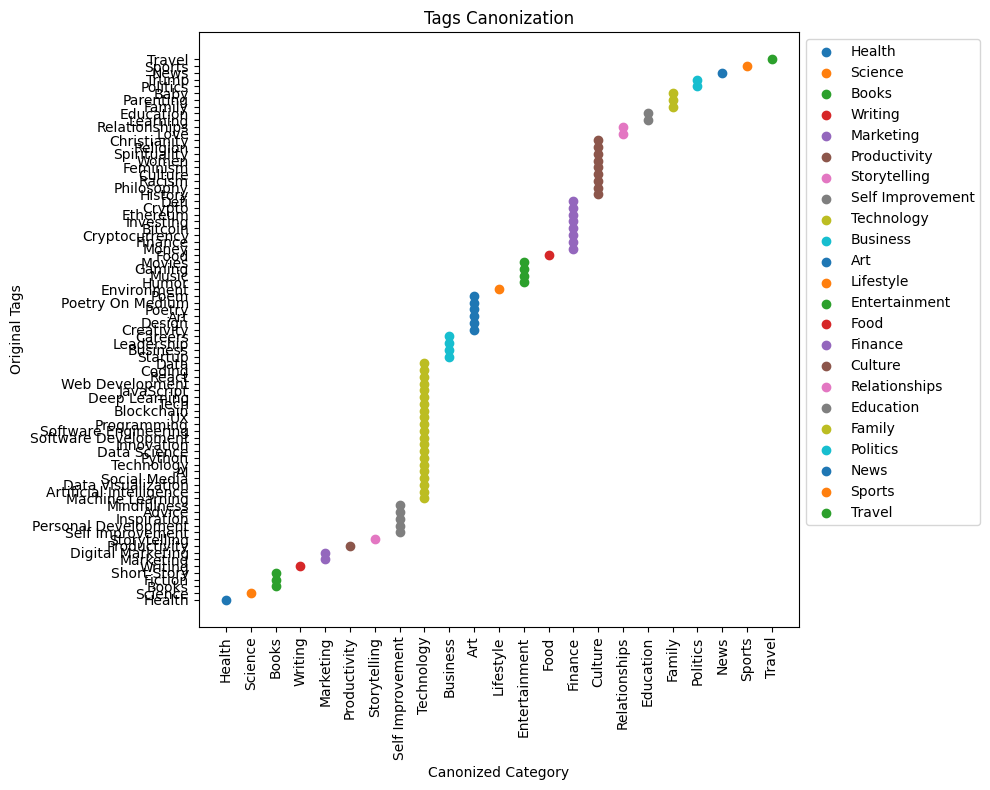

In [8]:
fig, ax = plt.subplots(figsize=(10, 8))

# Create a dictionary to store the (x, y) positions of each tag
positions = {}
y = 0

# Plot each key and its corresponding values
for key, values in d.items():
    ax.scatter([key] * len(values), values, label=key)
    for value in values:
        positions[value] = (key, y)
    y += 1

# Add title and labels
ax.set_title('Tags Canonization')
ax.set_xlabel('Canonized Category')
ax.set_ylabel('Original Tags')

# Rotate the x-axis labels for better readability
plt.xticks(rotation=90)

# Display the legend
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))

plt.tight_layout()
plt.show()

# Clustering Visuals

## Medium (n=2000)

In [31]:
models = ["minilm", "mpnet", "nomic", "specter", "bert", "word2vec"]
medium_2000_embeddings = load_embeddings("medium1k", models, 2000)

k_values = [5, 10, 20, 50, 100]
clustering_methods = {
    **{f"kmeans{k}": lambda x, k=k: clu.kmeans(x, k) for k in k_values},
    # **{f"dbscan_eps{eps}_min{min_samples}": lambda x, eps=eps, min_samples=min_samples: clu.dbscan(x, eps=eps, min_samples=min_samples) for eps in [0.1, 0.3, 0.5, 0.7, 1.0] for min_samples in [3, 5, 10, 15]},
    **{f"gmm{n_components}": lambda x, n_components=n_components: clu.gmm(x, n_components) for n_components in k_values},
    **{f"birch{k}": lambda x, k=k: clu.birch(x, k) for k in k_values}
}

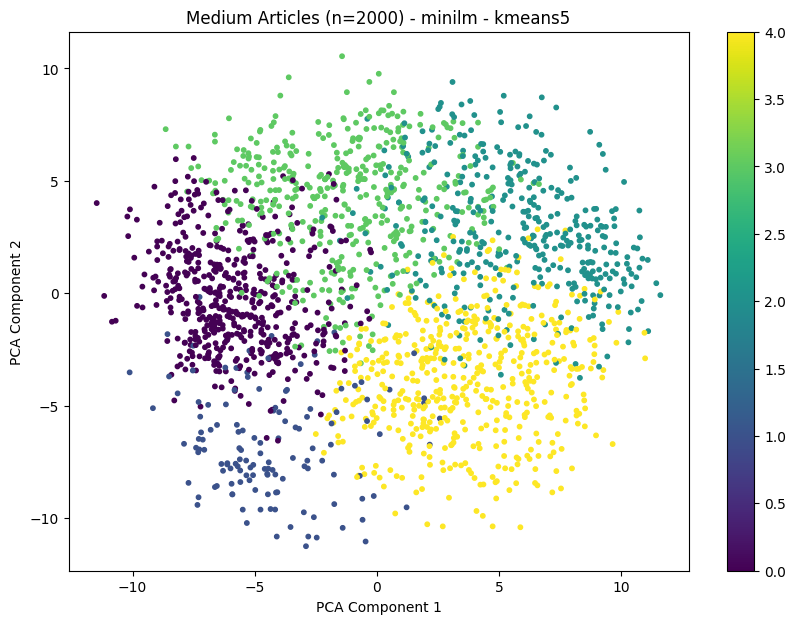

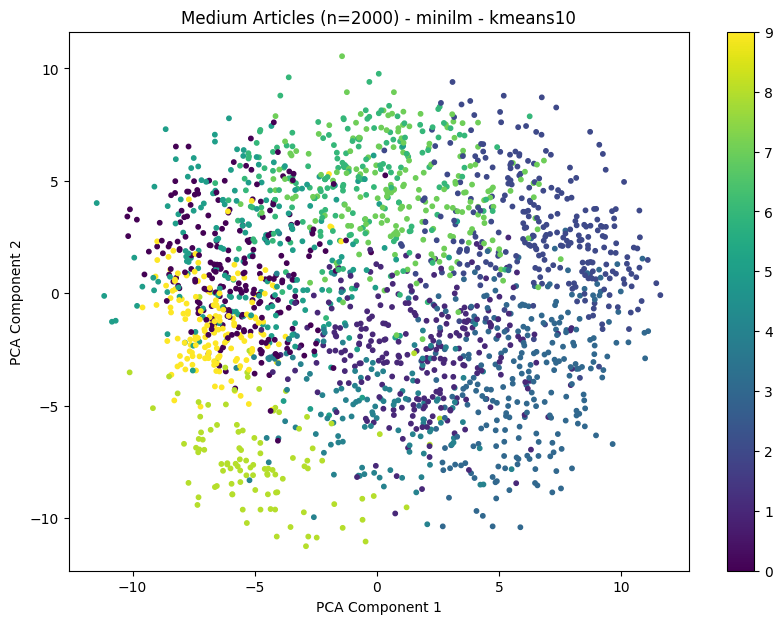

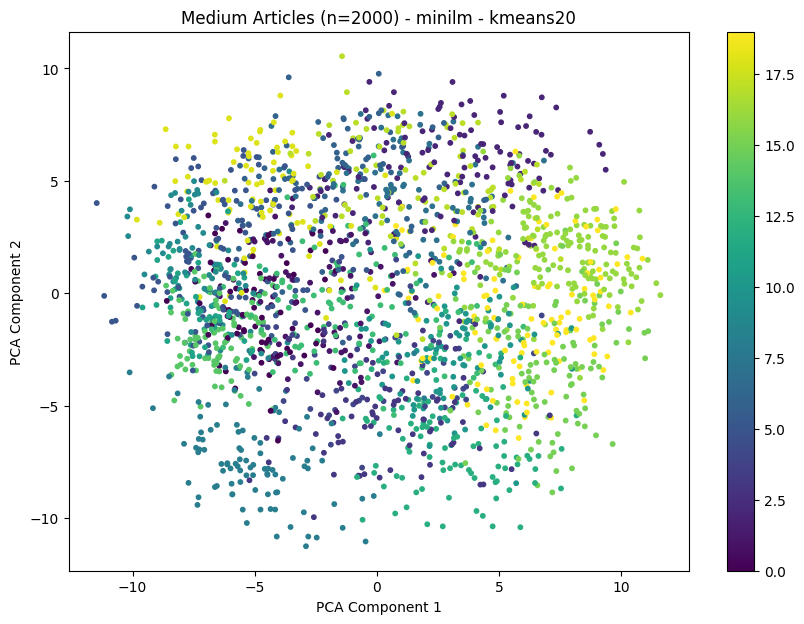

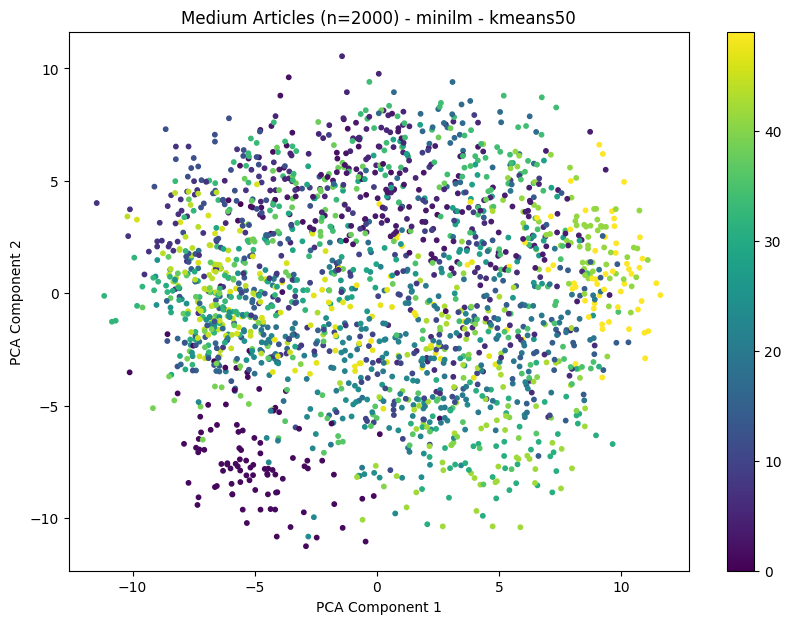

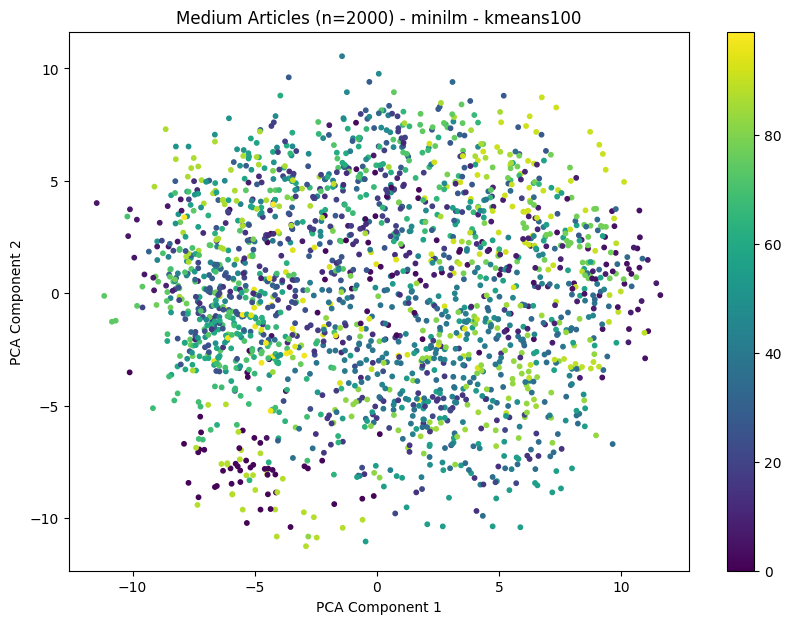

...

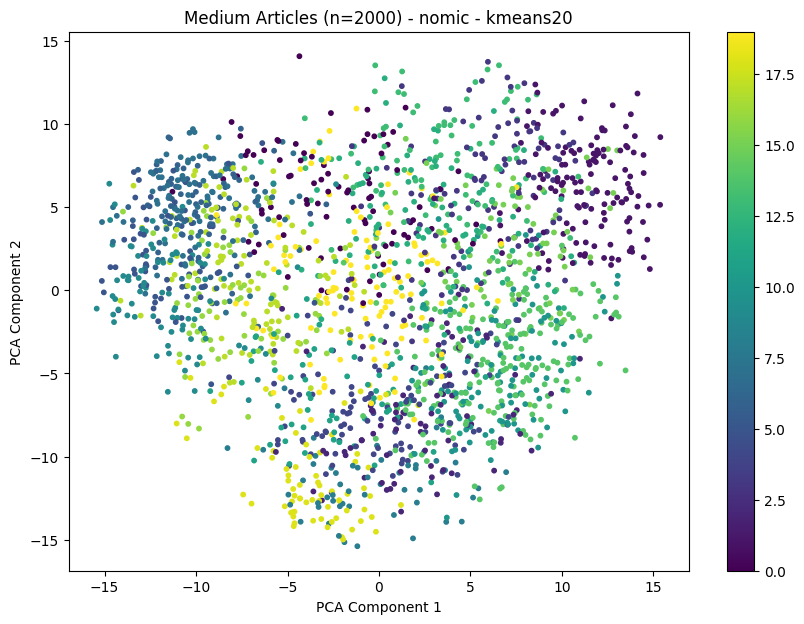

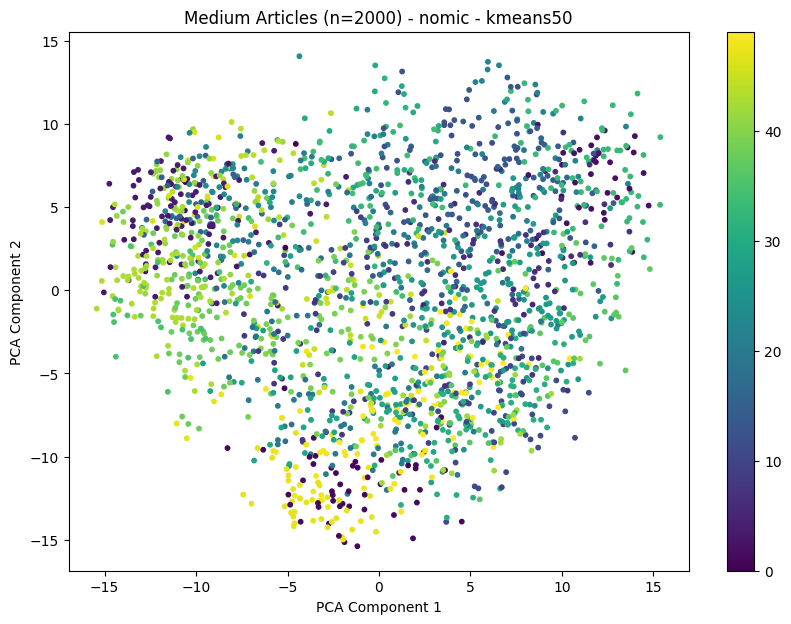

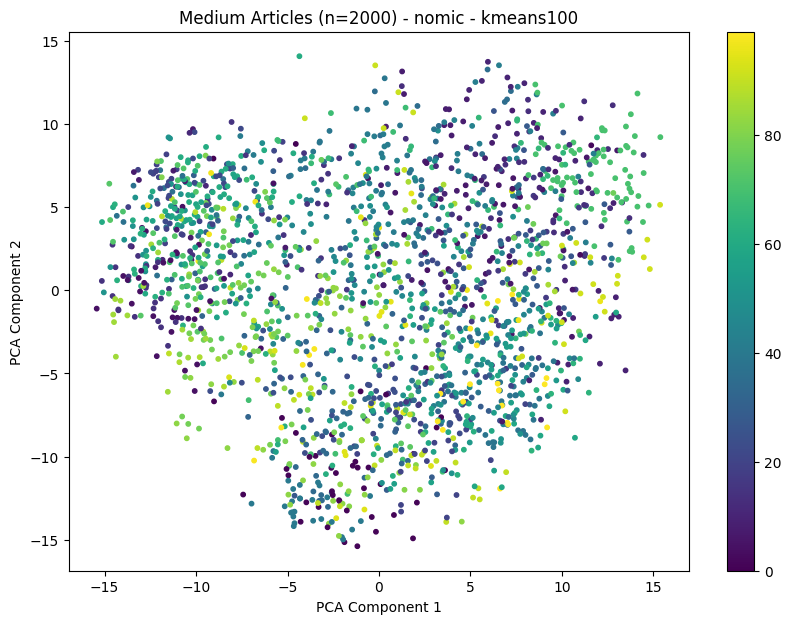

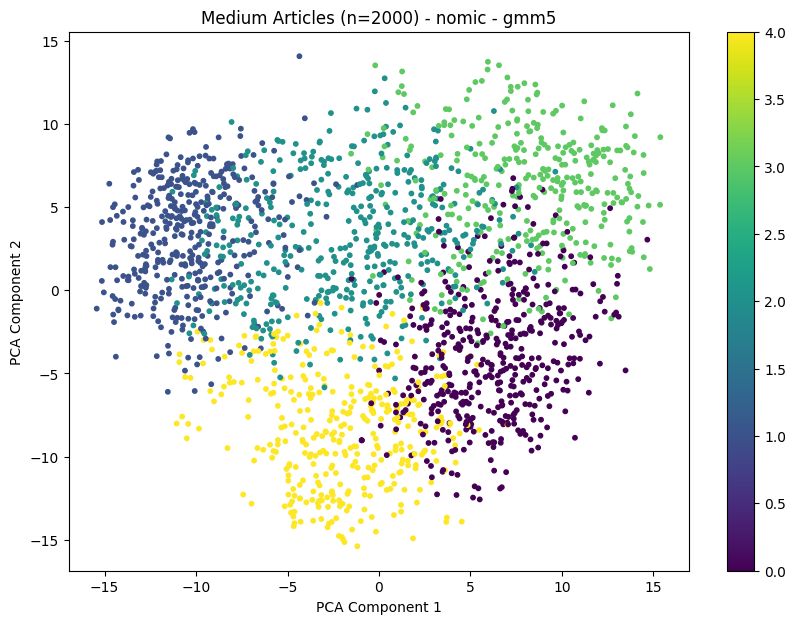

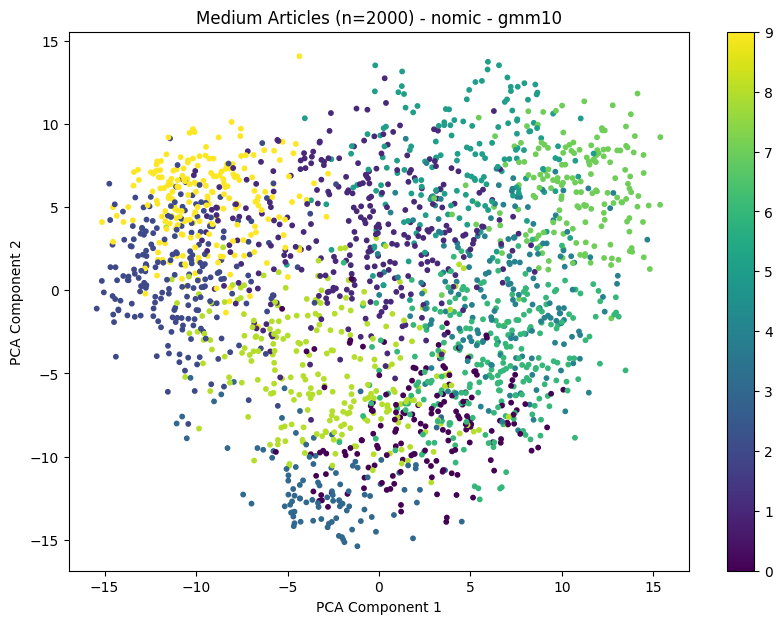

KeyboardInterrupt: 

In [32]:
def plot_clusters(embeddings, labels, title):
    pca = PCA(n_components=2)
    reduced_data = pca.fit_transform(StandardScaler().fit_transform(embeddings))
    
    plt.figure(figsize=(10, 7))
    scatter = plt.scatter(reduced_data[:, 0], reduced_data[:, 1], c=labels, cmap='viridis', s=10)
    plt.colorbar(scatter)
    plt.title(title)
    plt.xlabel("PCA Component 1")
    plt.ylabel("PCA Component 2")
    plt.show()



for model, embeddings in zip(models, medium_2000_embeddings):
    for method_name, method in clustering_methods.items():
        labels = method(embeddings)
        title = f"Medium Articles (n=2000) - {model} - {method_name}"
        plot_clusters(embeddings, labels, title)

## Medium (n=200)

In [33]:
models = ["minilm", "mpnet", "nomic", "specter", "bert", "word2vec"]
medium_200_embeddings = load_embeddings("medium1k", models, 200)

k_values = [5, 10, 20, 50, 100]
clustering_methods = {
    **{f"kmeans{k}": lambda x, k=k: clu.kmeans(x, k) for k in k_values},
    # **{f"dbscan_eps{eps}_min{min_samples}": lambda x, eps=eps, min_samples=min_samples: clu.dbscan(x, eps=eps, min_samples=min_samples) for eps in [0.1, 0.3, 0.5, 0.7, 1.0] for min_samples in [3, 5, 10, 15]},
    **{f"gmm{n_components}": lambda x, n_components=n_components: clu.gmm(x, n_components) for n_components in k_values},
    **{f"birch{k}": lambda x, k=k: clu.birch(x, k) for k in k_values}
}

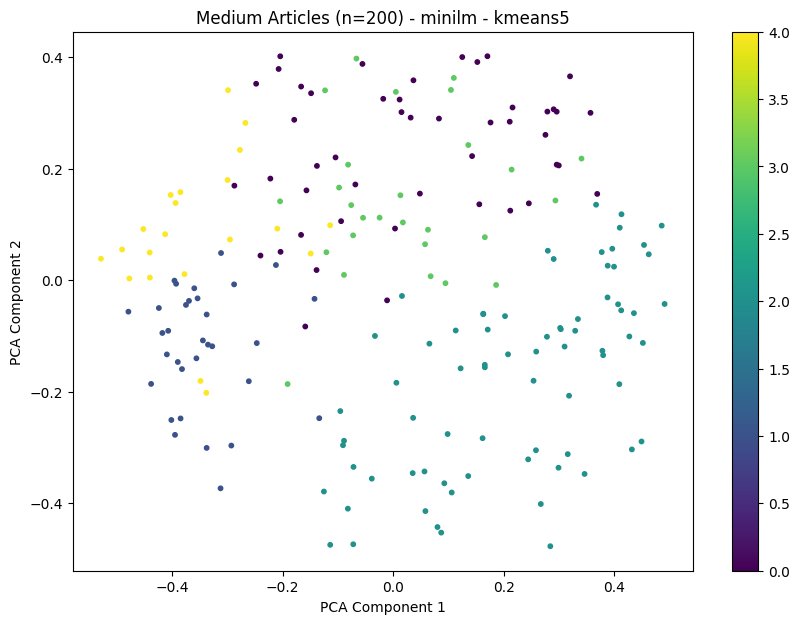

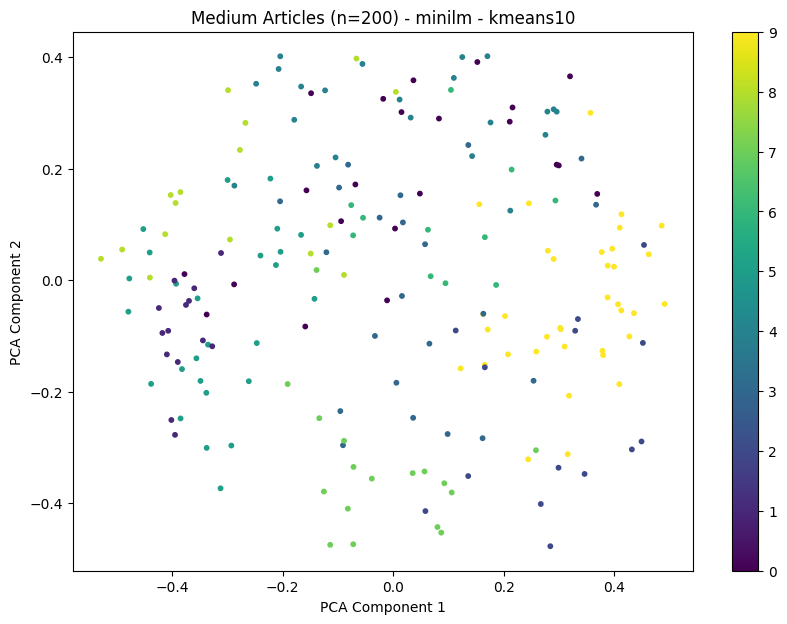

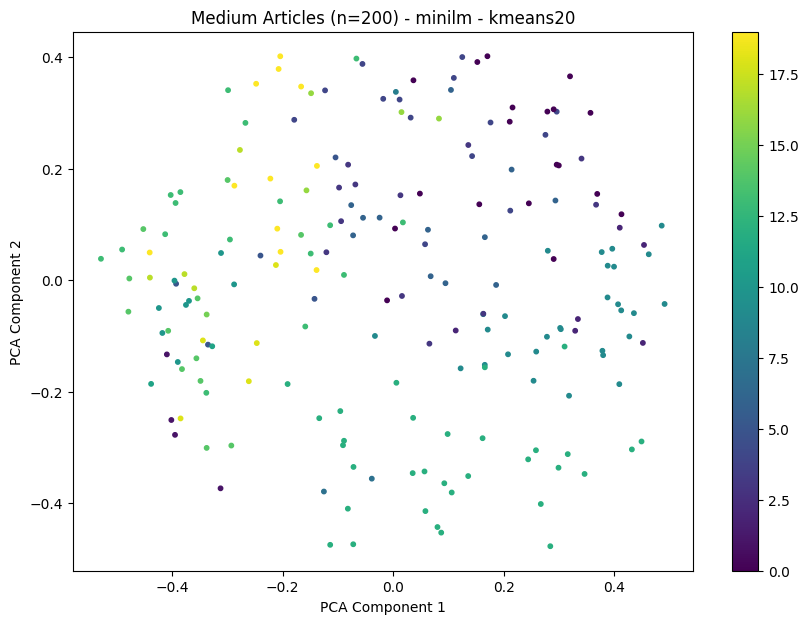

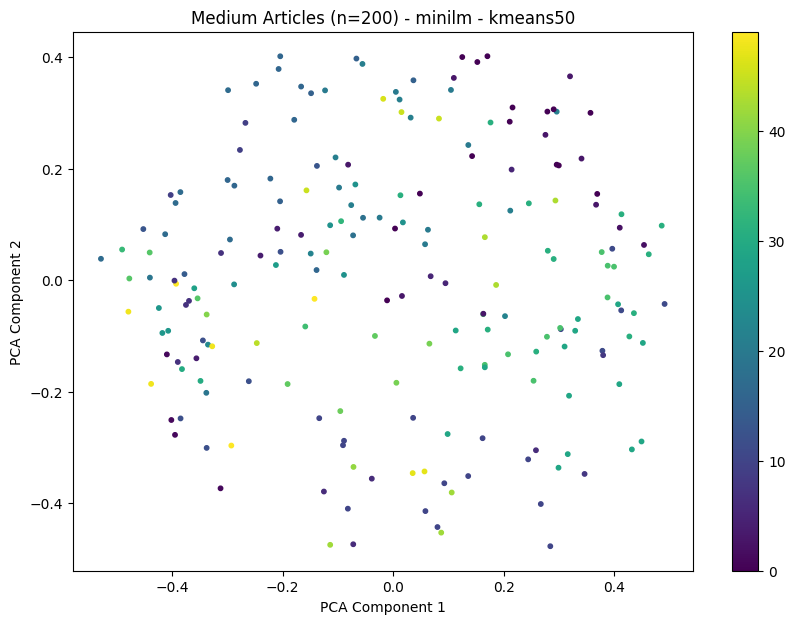

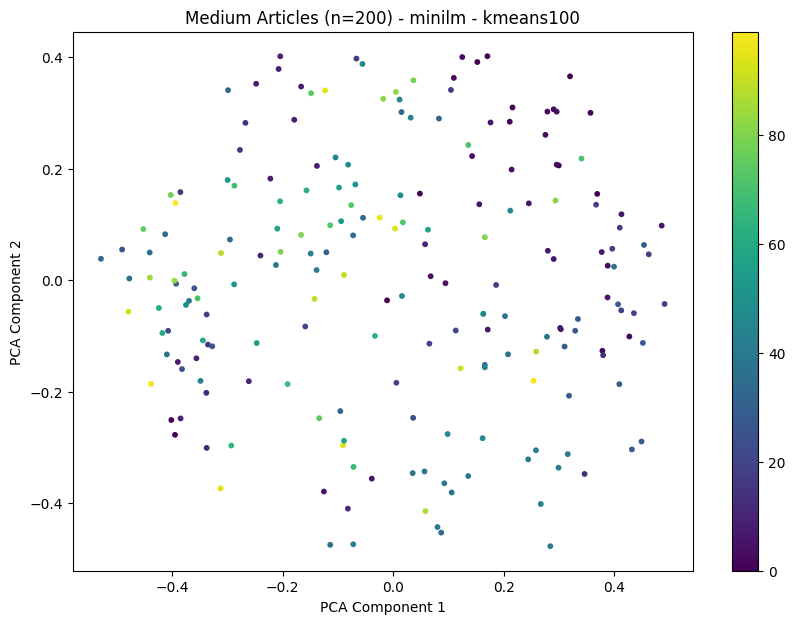

...

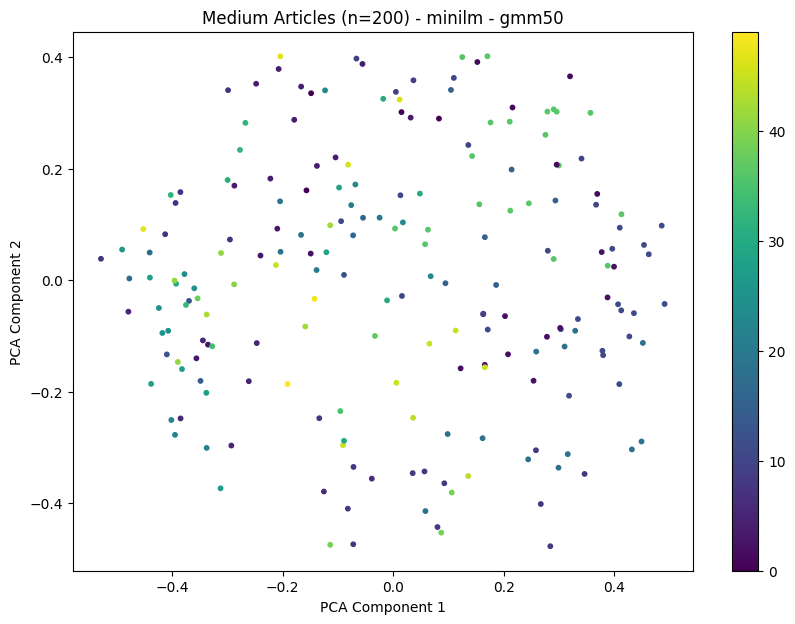

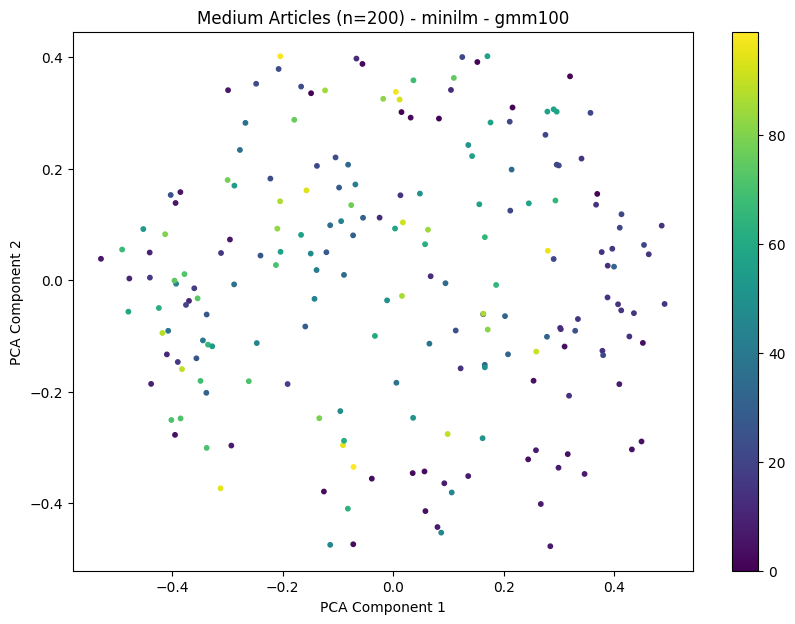

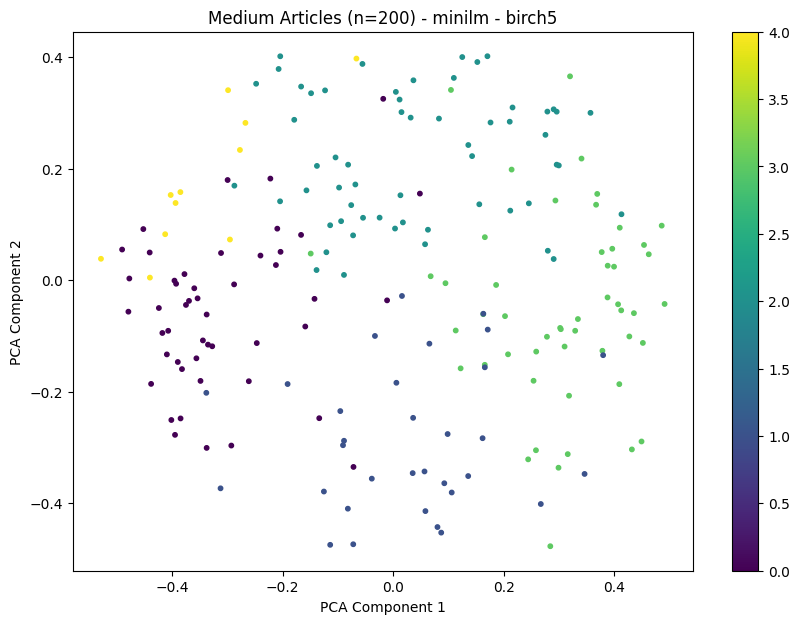

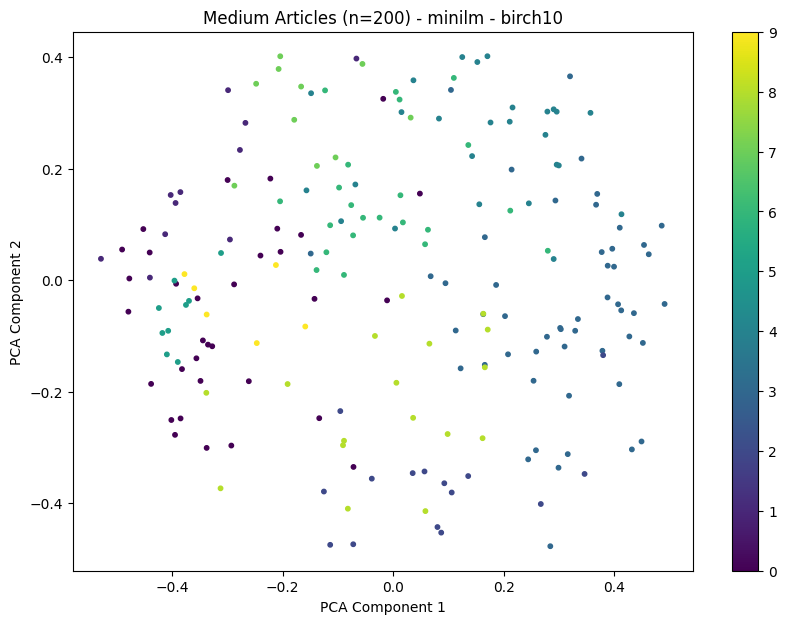

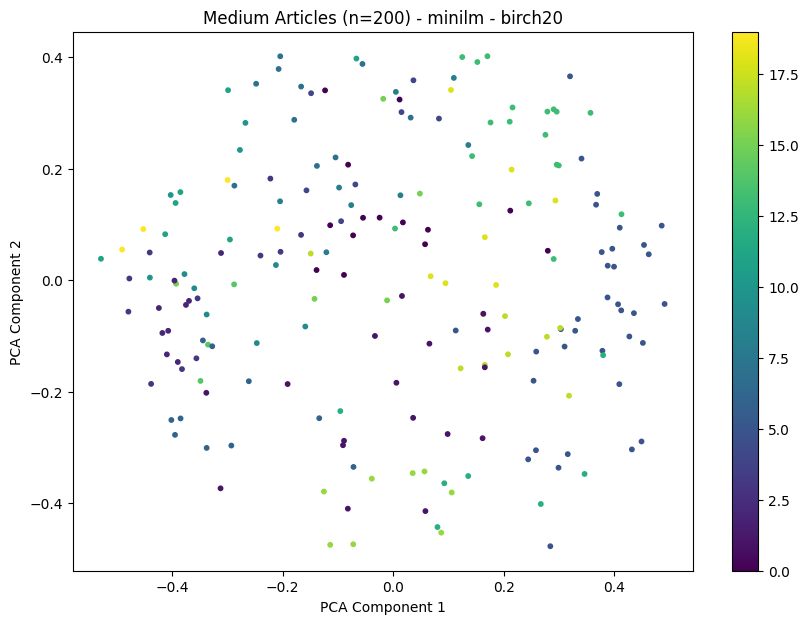

KeyboardInterrupt: 

In [35]:
def plot_clusters(embeddings, labels, title):
    pca = PCA(n_components=2)
    # reduced_data = pca.fit_transform(StandardScaler().fit_transform(embeddings))
    reduced_data = pca.fit_transform(embeddings)
    
    plt.figure(figsize=(10, 7))
    scatter = plt.scatter(reduced_data[:, 0], reduced_data[:, 1], c=labels, cmap='viridis', s=10)
    plt.colorbar(scatter)
    plt.title(title)
    plt.xlabel("PCA Component 1")
    plt.ylabel("PCA Component 2")
    plt.show()


for model, embeddings in zip(models, medium_200_embeddings):
    for method_name, method in clustering_methods.items():
        labels = method(embeddings)
        title = f"Medium Articles (n=200) - {model} - {method_name}"
        plot_clusters(embeddings, labels, title)

## ArXiv

In [19]:
arXiv_embeddings = load_embeddings("arXiv0", ["bert", "minilm", "mpnet", "nomic", "specter", "word2vec"])